# **Estandarizacion de nombres de mascaras, dataset y demas:**
- Al aplicarle una mascara a un dataset seria conveniente primero definir la mascara y en otra linea de codigo aplicarsela al dataset. Esto para que podamos ver bien que le estamos aplicando y que condiciones tiene esa mascara.
- Ojo con utilizar mascaras o alguna otra variable, dataframe y demas, definida mucho mas arriba. No vaya a ser que le cambiemos el nombre por x motivo y nos ollvidamos que mas abajo la usamos para otra cosa y se rompa todo
- Los nombres para las cosas que sean en ingles, separando las palabras con " _ " y en lo posible que se pueda intuir mediante el nombre a que se refiere
- Como practica totalmente arbitraria intentar que los nombres no tengan mas de 5 palabras. ej: " mask_rooms_zeros " , " mask_rooms_surf_zeros " y asi
- Si le llamamos " mask " a algo, que realmente lo sea. No que sea ya una mascara aplicada a un dataset. Eso es el dataset data filtrado por la mascara
- A estos nuevos dataset llamemosle igual que la mascara que le aplicamos solo que reemplazamos el nombre mask por data. ej:  " mask_rooms_zeros "=  " data_rooms_zeros ";                   " data_rooms_surf_zeros " = " data_rooms_surf_zeros "
- Cuando creemos un nuevo dataset, un array, una lista, una serie, mascara o lo que sea poner primero el nombre del tipo de objeto y despues lo que hace, para saber lo que es eso
- Cuando hacemos una mascara para ver si algo es nulo o cero ponemos solo " null ". Es para no alargar los nombres



## Hasta aca realizamos
- Transformacion de todos los ceros a nulos
- Limpieza de filas nulas
- Eliminacion de columnas sin informacion relevante y con informacion redundante
- Eliminacion de state_name que representen menos del 1% del total de instancias
- Correccion en las variables surface_covered_in_m2 y surface_total_in_m2 en los casos que la primera era mayor que la segunda no siendo posible esto
- Imputacion de nulos en la columna place_name (si hacemos el paso del split de place_with_parent_names ese paso hay que eliminarlo)
- imputacion de datos de price_aprox_usd, surface_total_in_m2 y rooms mediante expresiones regulares de las columnas description y title
- Imputacion de datos en surface_covered_in_m2 y surface_total_in_m2 cuando uno era nulo pero el otro no
- Imputacion de las variables surface_total_in_m2, price_aprox_usd y price_usd_per_m2 mediante deduccion de otras variables conocidas
- Definir si se desechan las instancias que representen menos del 1% en funcion del state_name. Este es un problema de granulacion, ya que con la actual nos quedamos con muy pocas instancias para el modelo, pero aumentando la granulacion (haciendo una agregacion de todas estas en una nueva categoria, ej: resto del pais), no desechamos las instancias y solo perdemos granularidad pero no toda la informacion.
- Corregir el patron con el que se busca el precio, para encontrar valores en pesos tambien, haciendo dos grupos, de esta manera el que matchee el grupo dolar se imputa directamente y el que matchee el grupo pesos imputarlo haciendo una conversion del valor. Por facilidad de codigo se imputa el primer grupo que matchea. **GERA , BENKOS Y ERICK**
- Sofisticar los patrones de las expresiones regulares para encontrar mas valores, especialmente en superficie. **GERA , BENKOS Y ERICK**
- La columna operation y country_name contienen una unica variable, en el caso de operation es sell y en el caso de country_name es argentina. No tiene sentido mantener las columnas siendo que no aportan informacion. Definir su tratamiento **PREGUNTAR A FABRI**
- Realizar una imputacion con media condicionada en rooms por superficie, y lugar. **GERA , BENKOS y ERICK** (falta la imputacion que no se bien como hacerla)
- Realizar una imputacion por media condicionada en superficie por media condicionada en rooms y lugar **GERA , BENKOS y ERICK** (falta la imputacion que no se bien como hacerla)
- Revisar si no hay otra forma de determinar el price y el price por metro cuadrado y si no lo hay tirar estas instancias que sean nulas **GERA , BENKOS y ERICK**
- Darle un tratamiento a expensas y floor. En propiedades tipo casas esta bien que sean nulas pero en departamentos no. Igualmente hay informacion ahi, quizas no sea bueno tirarla. *Como propuesta podriamos buscarlo con expresiones regulares en description y title ya que no tenemos de donde mas sacarla* *Tambien se podria ver la correlacion entre las expensas y el lugar y la superficie y si se encuentra una correlacion imputarlo por media condicionada por ejemplo **GERA , BENKOS y ERICK** **PREGUNTAR A FABRI**
## Falta realizar
- Darle un tratamiento a lat y lon y geonames id **VIERNES GERA**
- Creacion de nuevas columnas estilo **Cercania a un espacio verde** **Cercania a un subte** **Mapa de delito** **GERA, BENKOS y ERICK**
- deteccion de outliers
- Desechar las instancias que son outliers y que tienen nulos que no deberian tener
- EDA:  y representacion de datos y medidas estadisticas **PABLO Y ALE**
- Presentacion, formato revision de integridad de informacion **PABLO Y ALE**

# Importacion de librerias utilizadas

In [2]:
import pandas as pd
import numpy as np
import re

# Carga de la data de Properatti como un DataFrame de Pandas

In [3]:
data_location = "../Data/properatti.csv"

data = pd.read_csv(data_location, index_col=0)
data.head(3)

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839,...,40.0,1127.272727,1550.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...
1,sell,apartment,La Plata,|Argentina|Bs.As. G.B.A. Zona Sur|La Plata|,Argentina,Bs.As. G.B.A. Zona Sur,3432039.0,"-34.9038831,-57.9643295",-34.903883,-57.964330,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15bob_venta_depart...,Venta de departamento en décimo piso al frente...,VENTA Depto 2 dorm. a estrenar 7 e/ 36 y 37 ...,https://thumbs4.properati.com/7/ikpVBu2ztHA7jv...
2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982,...,55.0,1309.090909,1309.090909,NaN,NaN,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...


In [4]:
data.shape


(121220, 25)

# Analis preliminar del DataSet

In [92]:
# Usamos dtypes para saber que tipo de datos se almacenan en el dataset
data.dtypes

operation                      object
property_type                  object
place_name                     object
place_with_parent_names        object
country_name                   object
state_name                     object
geonames_id                   float64
lat-lon                        object
lat                           float64
lon                           float64
price                         float64
currency                       object
price_aprox_local_currency    float64
price_aprox_usd               float64
surface_total_in_m2           float64
surface_covered_in_m2         float64
price_usd_per_m2              float64
price_per_m2                  float64
floor                         float64
rooms                         float64
expenses                      float64
properati_url                  object
description                    object
title                          object
image_thumbnail                object
dtype: object

In [94]:
#Vemos cuantos valores nulos tenemos por columna
is_null_result = data.isnull().sum()
print(is_null_result)

operation                          0
property_type                      0
place_name                        23
place_with_parent_names            0
country_name                       0
state_name                         0
geonames_id                    18717
lat-lon                        51550
lat                            51550
lon                            51550
price                          20410
currency                       20411
price_aprox_local_currency     20410
price_aprox_usd                20410
surface_total_in_m2            39328
surface_covered_in_m2          19907
price_usd_per_m2               52603
price_per_m2                   33562
floor                         113321
rooms                          73830
expenses                      106958
properati_url                      0
description                        2
title                              0
image_thumbnail                 3112
dtype: int64


In [95]:
#Vemos que porcentaje de nulos tiene cada columna
percentage_null = 100*is_null_result/data.shape[0]
percentage_null

operation                      0.000000
property_type                  0.000000
place_name                     0.018974
place_with_parent_names        0.000000
country_name                   0.000000
state_name                     0.000000
geonames_id                   15.440521
lat-lon                       42.525986
lat                           42.525986
lon                           42.525986
price                         16.837156
currency                      16.837981
price_aprox_local_currency    16.837156
price_aprox_usd               16.837156
surface_total_in_m2           32.443491
surface_covered_in_m2         16.422208
price_usd_per_m2              43.394654
price_per_m2                  27.686850
floor                         93.483749
rooms                         60.905791
expenses                      88.234615
properati_url                  0.000000
description                    0.001650
title                          0.000000
image_thumbnail                2.567233


## Renombrado de la columna lat-lon

In [96]:
# Se renombra la columna lat-lon para sortear inconvenientes
data.rename(columns={'lat-lon': 'lat_lon'}, inplace=True)

## Verificacion de instancias nulas

In [97]:
# Se comprueban las instancias enteramente nulas y se las desecha 
data_clean_empty_row = data.dropna(axis = 0, how= 'all')
print(data.shape)
print(data_clean_empty_row.shape)
#En este caso no hay ninguna fila con todos los valores nulos

(121220, 25)
(121220, 25)


### Reemplazo de valores iguales a cero por Nan

##### *Se adopta este criterio ya que no existen variables que puedan tomar el valor cero, por lo que se los interpreta como nulos*

In [98]:
# Se reemplazan los ceros por NaN
data[data==0] = np.nan
(data==0).sum()

operation                     0
property_type                 0
place_name                    0
place_with_parent_names       0
country_name                  0
state_name                    0
geonames_id                   0
lat_lon                       0
lat                           0
lon                           0
price                         0
currency                      0
price_aprox_local_currency    0
price_aprox_usd               0
surface_total_in_m2           0
surface_covered_in_m2         0
price_usd_per_m2              0
price_per_m2                  0
floor                         0
rooms                         0
expenses                      0
properati_url                 0
description                   0
title                         0
image_thumbnail               0
dtype: int64

# Tratamiento de columnas con informacion no util o con informacion redundante

## Tratamiento de columnas *properati_url* y *image_thumbnail*

#### Se desechan las columnas *properati_url* y *image_thumbnail* ya que no aportan informacion util

In [99]:
# Se desechan las columnas properati_url y image_thumbnail de data
data = data.drop(['properati_url', 'image_thumbnail'], axis=1)
print("cantidad de columnas actuales=",data.shape[1])

cantidad de columnas actuales= 23


## Tratamiento de columnas *price* , *price_aprox_local_currency* y *price_aprox_usd* 

#### Como existe redundancia entre las columnas **price_aprox_usd**, **price** y **price_aprox_local_currency** se toma la decision de desechar  **price** y **price_aprox_local_currency**, pudiendo tambien descartar  **currency** ya que no aporta informacion adicional 
**Se asume igual fiabilidad de los datos en las tres variables**

In [100]:
# Primero se corrobora que no exista mas informacion en las columnas que se van a desechar que en la que va a quedar

# Se hacen tres mascaras para encontrar las instancias que tienen un valor nulo en esa columna
mask_price_null = data.price.isnull()
mask_price_aprox_local_currency_null = data.price_aprox_local_currency.isnull()
mask_price_aprox_usd_null = data.price_aprox_usd.isnull()

# Se hace una interseccion de las tres mascaras
mask_prices_null = mask_price_null & mask_price_aprox_local_currency_null & mask_price_aprox_usd_null

# Si las tres mascaras tienen cada una la misma cantidad de elementos que la interseccion significa que los nulos se encuentran en las mismas instancias
print("Cantidad de nulos en price= " , mask_price_null.sum())
print("cantidad de nulos en price_aprox_local_currency= " , mask_price_aprox_local_currency_null.sum())
print("Cantida de nulos en price_aprox_usd= " , mask_price_aprox_usd_null.sum())
print("Cantidad de nulos en la interseccion de las mascaras= " , mask_prices_null.sum())

# Devuelve un True si la cantidad de nulos es la misma en todas las mascaras por lo que la interseccion es perfecta
print(mask_price_null.sum()==mask_price_aprox_local_currency_null.sum()==mask_price_aprox_usd_null.sum()==mask_prices_null.sum())

Cantidad de nulos en price=  20411
cantidad de nulos en price_aprox_local_currency=  20411
Cantida de nulos en price_aprox_usd=  20411
Cantidad de nulos en la interseccion de las mascaras=  20411
True


In [101]:
# Como se cumple la condicion, se desechan las columnas price, price_aprox_local_currency y currency 
data = data.drop(['price', 'price_aprox_local_currency' , 'currency'], axis=1)
print("cantidad de columnas actuales= ",data.shape[1])

cantidad de columnas actuales=  20


## Tratamiento de columnas *price_usd_per_m2* y *price_per_m2*

#### Como existe redundancia entre las columnas *price_per_m2* y *price_usd_per_m2* se toma la decision de desechar la columna price_per_m2
**Asumimos igual fiabilidad de datos en ambas variables**

In [102]:
# Primero se corrobora que no exista mas informacion en la columna que se va a desechar que en la que va a quedar

# Se hacen dos mascaras para lencontrar las instancias que tienen un valor nulo en esa columna
mask_price_per_m2_null = data.price_per_m2.isnull()
mask_price_usd_per_m2_null = data.price_usd_per_m2.isnull()

# Se hace una interseccion de las dos mascaras
mask_prices_per_m2_null = mask_price_per_m2_null & mask_price_usd_per_m2_null 

# Si las tres mascaras tienen cada una la misma cantidad de elementos que la interseccion significa que los nulos se encuentran siempre en las mismas instancias
print("Cantidad de nulos en price_per_m2= " , mask_price_per_m2_null.sum())
print("cantidad de nulos en price_usd_per_m2= " , mask_price_usd_per_m2_null.sum())
print("Cantidad de nulos en la interseccion de las mascaras= " , mask_prices_per_m2_null.sum())

# Devuelve un True si la cantidad de nulos es la misma en todas las mascaras por lo que la interseccion es perfecta
print(mask_price_per_m2_null.sum()==mask_price_usd_per_m2_null.sum()==mask_prices_per_m2_null.sum())

Cantidad de nulos en price_per_m2=  33562
cantidad de nulos en price_usd_per_m2=  52603
Cantidad de nulos en la interseccion de las mascaras=  28295
False


##### *Como hay mas informacion en una columna que en la otra, en las instancias en que price_usd_per_m2 es nulo pero no lo es price_per_m2, se imputa el valor haciendo una conversion de moneda*

In [103]:
# Se hace una mascara para ver cuando es nula la columna price_usd_per_m2 pero no lo es price_per_m2
mask_prices_per_m2 = data.price_usd_per_m2.isnull() & data.price_per_m2.notnull()
data_prices_per_m2 = data [mask_prices_per_m2]

# Se define una variable que contenga el valor de conversion de pesos a dolar
pesos = 1/200

# Se imputa en price_usd_per_m2 el valor de price_per_m2 multiplicado por el valor de la conversion de pesos a dolar
data.loc[data_prices_per_m2.index,"price_usd_per_m2"] = pesos *data.loc[data_prices_per_m2.index, "price_per_m2"]

In [104]:
# Se desecha la columna price_per_m2
data = data.drop(['price_per_m2'], axis=1)
print("cantidad de columnas actuales= ",data.shape[1])

cantidad de columnas actuales=  19


## Tratamiento de columnas *lat-lon*, *lat* y *lon*

#### Como existe redundancia entre las columnas *lat-lon*, *lat* y *lon* se toma la decision de desechar la columna *lat-lon*
**Asumimos igual fiabilidad de datos en las tres variables**

In [105]:
# Primero se corrobora que no exista mas informacion en la columna que se va a desechar que en lsa que se van a quedar

# Se hacen tres mascaras para encontrar las instancias de latitud y longitud que contengan los nulos de las mismas
mask_lat_lon_null = data.lat_lon.isnull()
mask_lat_null = data.lat.isnull()
mask_lon_null = data.lon.isnull()

# Se hace una interseccion de las tres mascaras
mask_inter_lat_lon_null = mask_lat_lon_null & mask_lat_null & mask_lon_null

# Si las tres mascaras tienen cada una la misma cantidad de elementos que la interseccion significa que los nulos se encuentran siempre en las mismas instancias
print("Cantidad de nulos en lat-lon= " , mask_lat_lon_null.sum())
print("cantidad de nulos en lat= " , mask_lat_null.sum())
print("Cantida de nulos en lon= " , mask_lon_null.sum())
print("Cantidad de nulos en la interseccion de las mascaras= " , mask_inter_lat_lon_null.sum())

# Devuelve un True si la cantidad de nulos es la misma en todas las mascaras por lo que la interseccion es perfecta
print(mask_lat_lon_null.sum()==mask_lat_null.sum()==mask_lon_null.sum()==mask_inter_lat_lon_null.sum())

Cantidad de nulos en lat-lon=  51550
cantidad de nulos en lat=  51550
Cantida de nulos en lon=  51550
Cantidad de nulos en la interseccion de las mascaras=  51550
True


In [106]:
# Como la condicion se cumple, se desecha la columna lat_lon
data = data.drop(['lat_lon'], axis=1)
print("cantidad de columnas actuales= ",data.shape[1])

cantidad de columnas actuales=  18


# Analisis de instancias en funcion del state_name

In [1]:
# Se presentan todos los diferentes state_name que hay en el DataSet
data.state_name.unique()

NameError: name 'data' is not defined

In [108]:
# Se presentan la cantidad de instancias que acumula cada state_name
state_name_distribution = pd.value_counts(data.state_name)
state_name_distribution

Capital Federal                 32316
Bs.As. G.B.A. Zona Norte        25560
Bs.As. G.B.A. Zona Sur          13952
Córdoba                         12069
Santa Fe                        10172
Buenos Aires Costa Atlántica    10006
Bs.As. G.B.A. Zona Oeste         9322
Buenos Aires Interior            2291
Río Negro                         808
Neuquén                           733
Mendoza                           681
Tucumán                           674
Corrientes                        583
Misiones                          464
Entre Ríos                        369
Salta                             278
Chubut                            259
San Luis                          252
La Pampa                          157
Formosa                            65
Chaco                              57
San Juan                           40
Tierra Del Fuego                   31
Catamarca                          27
Jujuy                              26
Santa Cruz                         20
La Rioja    

In [109]:
# Se presentan los porcentajes de la distribucion de los datos por state_name
total_data = data.shape[0]
percentage_state_name = 100*state_name_distribution/total_data
percentage_state_name

Capital Federal                 26.658967
Bs.As. G.B.A. Zona Norte        21.085629
Bs.As. G.B.A. Zona Sur          11.509652
Córdoba                          9.956278
Santa Fe                         8.391355
Buenos Aires Costa Atlántica     8.254413
Bs.As. G.B.A. Zona Oeste         7.690150
Buenos Aires Interior            1.889952
Río Negro                        0.666557
Neuquén                          0.604686
Mendoza                          0.561788
Tucumán                          0.556014
Corrientes                       0.480944
Misiones                         0.382775
Entre Ríos                       0.304405
Salta                            0.229335
Chubut                           0.213661
San Luis                         0.207886
La Pampa                         0.129517
Formosa                          0.053622
Chaco                            0.047022
San Juan                         0.032998
Tierra Del Fuego                 0.025573
Catamarca                        0

### Se toma la decision de desechar las instancias correspondientes a los *state_name* que representan < 1% del total de instancias.

#### **Tomamos esta decision ya que consideramos que en estos state_names no contamos con las instancias suficientes como para realizar un analisis fiable**

In [110]:
# Se le aplica una mascara a la serie percentage_state_name con la condicion de que el state_name sea mayor a 1%
mask_1_percent = percentage_state_name > 1
series_1_percent = percentage_state_name [mask_1_percent]
print(f'Se desecha el  {round(100 - series_1_percent.sum(), 2)}% del total de los datos')
round(series_1_percent, 2)

Se desecha el  4.56% del total de los datos


Capital Federal                 26.66
Bs.As. G.B.A. Zona Norte        21.09
Bs.As. G.B.A. Zona Sur          11.51
Córdoba                          9.96
Santa Fe                         8.39
Buenos Aires Costa Atlántica     8.25
Bs.As. G.B.A. Zona Oeste         7.69
Buenos Aires Interior            1.89
Name: state_name, dtype: float64

In [111]:
# Se descartan las instancias en las que su state_name no este dentro del indice de la serie series_1_percent
data = data[data.state_name.isin(series_1_percent.index)]

## Desagregacion de la columna place_with_parent_names

**Consideracion:** *Capital federal esta considerado como state_name, por lo que en city_name iran los barrios de la ciudad*

##### **Para realizar esto se asume igual fiabilidad en los datos de las columnas place_name, country_name, state_name y place_with_parent_names**

In [112]:
#  Se realiza un split a la columna place_with_parent_names
data_place_with_parent_names = data["place_with_parent_names"].str.split("|", expand=True)
data_place_with_parent_names.head(3)

,0,1,2,3,4,5,6
0,,Argentina,Capital Federal,Mataderos,,None,None
1,,Argentina,Bs.As. G.B.A. Zona Sur,La Plata,,None,None
2,,Argentina,Capital Federal,Mataderos,,None,None


In [113]:
# Se descartan las columnas 0, 5 y 6 ya que contienen no contienen informacion
data_place_with_parent_names = data_place_with_parent_names.drop([0,5,6], axis=1)

In [114]:
# Se renombran las columnas
data_place_with_parent_names.rename(columns={1: 'country_name' , 2 : 'state_name' , 3 : 'city_name' , 4 : 'neighborhood_name'}, inplace=True)
data_place_with_parent_names.columns

Index(['country_name', 'state_name', 'city_name', 'neighborhood_name'], dtype='object')

In [115]:
# Se visualiza el total de strings vacios ""
print( "El total de strings vacios es= \n" , data_place_with_parent_names.isnull().sum())
# Se visualiza el total de nulos
print( "El total de nulos es= \n" , (data_place_with_parent_names=='').sum())

El total de strings vacios es= 
 country_name            0
state_name              0
city_name               0
neighborhood_name    4422
dtype: int64
El total de nulos es= 
 country_name             0
state_name               0
city_name             4422
neighborhood_name    71487
dtype: int64


In [116]:
# Se reemplazan las cadenas vacias en city_name a nulos
data_city_name_empty = data_place_with_parent_names[data_place_with_parent_names.city_name==""]
data_place_with_parent_names.loc[data_city_name_empty.index,"city_name"] = None

# Se reemplazan las cadenas vacias en neighborhood_name a nulos
data_neighborhood_name_empty = data_place_with_parent_names[data_place_with_parent_names.neighborhood_name==""]
data_place_with_parent_names.loc[data_neighborhood_name_empty.index,"neighborhood_name"] = None

In [117]:
# Se visualiza el total de strings vacios ""
print( "El total de strings vacios es= \n" , data_place_with_parent_names.isnull().sum())

# Se visualiza el total de nulos
print( "El total de nulos es= \n" , (data_place_with_parent_names=='').sum())

El total de strings vacios es= 
 country_name             0
state_name               0
city_name             4422
neighborhood_name    75909
dtype: int64
El total de nulos es= 
 country_name         0
state_name           0
city_name            0
neighborhood_name    0
dtype: int64


In [118]:
# Se eliminan en data las columnas que se van a reemplazar
data = data.drop(["place_name","place_with_parent_names","country_name","state_name"], axis=1)

In [119]:
# Se concatena data con data_place_with_parent_names. Se realiza con concat ya que tienen el mismo orden las instancias 
data = pd.concat([data, data_place_with_parent_names], axis=1)
data.columns

Index(['operation', 'property_type', 'geonames_id', 'lat', 'lon',
       'price_aprox_usd', 'surface_total_in_m2', 'surface_covered_in_m2',
       'price_usd_per_m2', 'floor', 'rooms', 'expenses', 'description',
       'title', 'country_name', 'state_name', 'city_name',
       'neighborhood_name'],
      dtype='object')

In [120]:
# Se reordenan las columnas para que queden en el orden original
data= data[['operation', 'property_type','country_name', 'state_name', 'city_name', 
            'neighborhood_name', 'geonames_id', 'lat', 'lon','price_aprox_usd', 
            'surface_total_in_m2', 'surface_covered_in_m2',
       'price_usd_per_m2', 'floor', 'rooms', 'expenses', 'description',
       'title',]]

## Correccion de instancias que tienen surface_total_in_m2 < surface_covered_in_m2

In [121]:
# Se corrobora en que casos el valor surface_total_in_m2 es menor que el valor surface_covered_in_m2
mask_surface = data.surface_total_in_m2 < data.surface_covered_in_m2
data_surface = data[mask_surface]

# Se le asigna en funcion del index de data_surface, los valores de surface_total_in_m2 a surface_covered_in_m2 y viceversa
data.loc[data_surface.index, "surface_total_in_m2"] = data_surface.loc[data_surface.index, "surface_covered_in_m2"]
data.loc[data_surface.index, "surface_covered_in_m2"] = data_surface.loc[data_surface.index, "surface_total_in_m2"]

# Imputacion de datos faltantes

# Logica a seguir para la imputacion de datos faltantes
1. Imputacion de datos obtenidos mediante expresiones regulares en las columnas description y title
2. Imputacion directa mediante deduccion con valores de otras columnas
3. Imputacion mediante media condicionada (esta metodologia no se aplica en columnas de precio)

## Obtencion de datos con expresiones regulares de las columnas *description* y *title*

## Obtencion de rooms con expresiones regulares

##### *Se obtienen los rooms nulos en primera instancia con expresiones regulares. No se obtienen primero con una media condicionada de la superficie cubierta y el lugar ya que es mas preciso obtenerlos con un dato directo del dataset*

### Obtencion de rooms con expresion regular en *description*

In [122]:
# Se obtiene a partir de data una serie que contenga las instancias con rooms nulos
mask_rooms_null =  data.rooms.isnull()
data_rooms_null = data [mask_rooms_null]
series_rooms_null_description = data_rooms_null.description

print("Cantidad de instancias en las que se va a aplicar la expresion regular= ",series_rooms_null_description.shape[0])

Cantidad de instancias en las que se va a aplicar la expresion regular=  69989


In [123]:
# logica del patron: Toma un numero de un digito o mas,seguido o no de un espacio o mas y de las letras amb no distinguiendo entre mayusculas y minusculas
pattern = "(?P<rooms>\d+)\s+(?i)amb"
pattern_rooms_regex = re.compile(pattern)

In [124]:
# Se aplica una funcion lamda para recorrer la serie series_rooms_null_description aplicando la expresion regular
description_rooms_result = series_rooms_null_description.apply(lambda x: pattern_rooms_regex.search(str(x)))

# Se extraen los datos que usaremos para la imputación
description_rooms_match = description_rooms_result.apply(lambda x: np.nan if x is None else x.group('rooms'))

print("Rooms matcheados=",(description_rooms_match.notnull()).sum()) # Se ve la cantidad que pudo matchear
print(description_rooms_match.unique()) # Se ven todos los rooms unicos que matcheo

Rooms matcheados= 18608
['2' nan '3' '1' '4' '7' '5' '6' '9' '2017' '103' '297' '072' '000' '11'
 '8' '085' '37' '800' '10' '12' '900' '0002' '400' '20174' '006' '17' '90'
 '0001' '772' '2004' '14' '24' '50' '20' '23' '65' '20173']


In [125]:
# Se imputa la serie description_rooms_match con su index en data
data.loc[description_rooms_match.index, "rooms"] = description_rooms_match 

### Obtencion de rooms con expresion regular en *title*

In [126]:
# Se obtiene a partir de data una serie que contenga las instancias con rooms nulos
mask_rooms_null = data.rooms.isnull()
data_rooms_null = data [mask_rooms_null]
series_rooms_null_title = data_rooms_null.title

print("Cantidad de instancias en las que se va a aplicar la expresion regular= ",series_rooms_null_title.shape[0])

Cantidad de instancias en las que se va a aplicar la expresion regular=  51381


In [127]:
# Se aplica una funcion lamda para recorrer la serie series_rooms_null_title aplicando la expresion regular
title_rooms_result = series_rooms_null_title.apply(lambda x: pattern_rooms_regex.search(str(x)))

# Se extraen los datos que usaremos para la imputación
title_rooms_match = title_rooms_result.apply(lambda x: np.nan if x is None else x.group('rooms'))

print("Rooms matcheados=",(title_rooms_match.notnull()).sum())  # Se ve la cantidad que pudo matchear
print(title_rooms_match.unique()) # Se ven todos los rooms unicos que matcheo

Rooms matcheados= 2505
[nan '2' '6' '3' '4' '5' '9' '1' '7' '8' '15' '4000' '360' '12']


In [128]:
# Se imputa la serie title_rooms_match con su index en data
data.loc[title_rooms_match.index, "rooms"] = title_rooms_match 

In [129]:
# Se cambia el tipo de dato de object a float
data["rooms"] = data["rooms"].astype("float")
data[["rooms"]].dtypes

rooms    float64
dtype: object

## Obtencion de surface_total_in_m2 con expresiones regulares

##### *Se obtienen la superficie en la que ambas superficies sean nulas y el precio y el precio por metro cuadrado es nulo. De esta manera sabemos que no podemos imputar una superficie con la otra y no podemos inferir la superficie mediante el precio y el precio por metro cuadrado*

### Obtencion de surface_total_in_m2 con expresion regular en *description*

In [130]:
# Se obtiene a partir de data una serie que contenga las instancias en las que se va a aplicar la expresion regular
surfaces_condition = data.surface_total_in_m2.isnull() & data.surface_covered_in_m2.isnull()
price_condition = data.price_aprox_usd.isnull()
price_per_m2_condition = data.price_usd_per_m2.isnull()
mask_surface_total_in_m2_null = surfaces_condition & (price_condition | price_per_m2_condition)
data_surface_total_in_m2_null = data [mask_surface_total_in_m2_null]
series_surface_total_in_m2_null_description = data_surface_total_in_m2_null.description

print("Cantidad de instancias en las que se va a aplicar la expresion regular= ",series_surface_total_in_m2_null_description.shape[0])

Cantidad de instancias en las que se va a aplicar la expresion regular=  11437


In [131]:
# logica del patron: Toma un numero de un digito o mas,seguido o no de un espacio o mas y de las letras [m2,mts,metro] no distinguiendo entre mayusculas y minusculas
pattern = "(?P<surface_total_in_m2>\d+)\s+(?i)[m2|mts|metro]"
pattern_surface_total_in_m2_regex = re.compile(pattern)

In [132]:
# Se aplica una funcion lamda para recorrer la serie series_surface_total_in_m2_null_description aplicando la expresion regular
description_surface_total_in_m2_result = series_surface_total_in_m2_null_description.apply(lambda x: pattern_surface_total_in_m2_regex.search(str(x)))

# Se extraen los datos que usaremos para la imputación
description_surface_total_in_m2_match = description_surface_total_in_m2_result.apply(lambda x: np.nan if x is None else x.group('surface_total_in_m2'))

print("surfaces matcheados=",(description_surface_total_in_m2_match.notnull()).sum()) #aca veo que cantidad pudo matchear

surfaces matcheados= 4114


In [133]:
# Se imputa la serie description_surface_total_in_m2_match con su index en data
data.loc[description_surface_total_in_m2_match.index, "surface_total_in_m2"] = description_surface_total_in_m2_match 

### Obtencion de surface_total_in_m2 con expresion regular en *title*

In [134]:
# Se obtiene a partir de data una serie que contenga las instancias en las que se va a aplicar la expresion regular
surfaces_condition = data.surface_total_in_m2.isnull() & data.surface_covered_in_m2.isnull()
price_condition = data.price_aprox_usd.isnull()
price_per_m2_condition = data.price_usd_per_m2.isnull()
mask_surface_total_in_m2_null = surfaces_condition & (price_condition | price_per_m2_condition)
data_surface_total_in_m2_null = data [mask_surface_total_in_m2_null]
series_surface_total_in_m2_null_title = data_surface_total_in_m2_null.title

print("Cantidad de instancias en las que se va a aplicar la expresion regular= ",series_surface_total_in_m2_null_description.shape[0])

Cantidad de instancias en las que se va a aplicar la expresion regular=  11437


In [135]:
# Se aplica una funcion lamda para recorrer la serie series_surface_total_in_m2_null_title aplicando la expresion regular
title_surface_total_in_m2_result = series_surface_total_in_m2_null_title.apply(lambda x: pattern_surface_total_in_m2_regex.search(str(x)))

# Se extraen los datos que usaremos para la imputación
title_surface_total_in_m2_match = title_surface_total_in_m2_result.apply(lambda x: np.nan if x is None else x.group('surface_total_in_m2'))

print("surfaces matcheados= ",(title_surface_total_in_m2_match.notnull()).sum()) #aca veo que cantidad pudo matchear

surfaces matcheados=  113


In [136]:
# Se imputa la serie title_surface_total_in_m2_match con su index en data
data.loc[title_surface_total_in_m2_match.index, "surface_total_in_m2"] = title_surface_total_in_m2_match 

In [137]:
# Se cambia el tipo de dato de object a float
data["surface_total_in_m2"] = data["surface_total_in_m2"].astype("float")
data[["surface_total_in_m2"]].dtypes

surface_total_in_m2    float64
dtype: object

## Obtencion de price_aprox_usd mediante expresiones regulares

##### *Se quiere obtener el price_aprox_usd para las instancias en las que no tenemos price_aprox_usd y tampoco tenemos surface_total_in_m2 y surface_total_in_m2 o no tenemos price_usd_per_m2 y price_per_m2 *

### Obtencion de price con expresion regular en *description*

In [138]:
# Se obtiene a partir de data una serie que contenga las instancias en las que se va a aplicar la expresion regular
surface_condition = data.surface_total_in_m2.isnull() & data.surface_covered_in_m2.isnull()
price_condition = data.price_aprox_usd.isnull()
price_per_m2_condition = data.price_usd_per_m2.isnull()
mask_price_null = price_condition & (price_per_m2_condition | surfaces_condition)
data_price_null = data [mask_price_null]
series_price_null_description = data_price_null.description

print("Cantidad de instancias en las que se va a aplicar la expresion regular= ",series_price_null_description.shape[0])

Cantidad de instancias en las que se va a aplicar la expresion regular=  17871


In [139]:
# logica del patron: toma la combinacion de letras usd indistintamente de ser mayusculas o minusculas seguido de un espacio o mas y seguido de un numero de un numero de un digito o mas
pattern = "(?i)usd\s+(?P<price_aprox_usd>\d+)"
pattern_price_regex = re.compile(pattern)

In [140]:
# Se aplica una funcion lamda para recorrer la serie series_surface_total_in_m2_null_description aplicando la expresion regular
description_price_result = series_price_null_description.apply(lambda x: pattern_price_regex.search(str(x)))

# Se extraen los datos que usaremos para la imputación
description_price_match = description_price_result.apply(lambda x: np.nan if x is None else x.group('price_aprox_usd'))

print("price matcheados= ",(description_price_match.notnull()).sum()) #aca veo que cantidad pudo matchear

price matcheados=  370


In [141]:
# Se imputa la serie description_price_match con su index en data
data.loc[description_price_match.index, "price_aprox_usd"] = description_price_match 

### Obtencion de price con expresion regular en *title*

In [142]:
# Se obtiene a partir de data una serie que contenga las instancias en las que se va a aplicar la expresion regular
surface_condition = data.surface_total_in_m2.isnull() & data.surface_covered_in_m2.isnull()
price_condition = data.price_aprox_usd.isnull()
price_per_m2_condition = data.price_usd_per_m2.isnull()
mask_price_null = price_condition & (price_per_m2_condition | surfaces_condition)
data_price_null = data [mask_price_null]
series_price_null_title = data_price_null.title

print("Cantidad de instancias en las que se va a aplicar la expresion regular= ",series_price_null_description.shape[0])

Cantidad de instancias en las que se va a aplicar la expresion regular=  17871


In [143]:
# Se aplica una funcion lamda para recorrer la serie series_price_null_title aplicando la expresion regular
title_price_result = series_price_null_title.apply(lambda x: pattern_price_regex.search(str(x)))

# Se extraen los datos que usaremos para la imputación
title_price_match = title_price_result.apply(lambda x: np.nan if x is None else x.group('price_aprox_usd'))

print("price matcheados= ",(title_price_match.notnull()).sum()) #aca veo que cantidad pudo matchear

price matcheados=  1


In [144]:
# Se imputa la serie title_price_match con su index en data
data.loc[title_price_match.index, "price_aprox_usd"] = title_price_match 

In [145]:
# Se cambia el tipo de dato de object a float
data["price_aprox_usd"] = data["price_aprox_usd"].astype("float")
data[["price_aprox_usd"]].dtypes

price_aprox_usd    float64
dtype: object

## Obtencion de floor mediante expresiones regulares

##### *Se quiere obtener el floor para las instancias en las que es nulo*

### Obtencion de floor con expresion regular en *description*

In [146]:
# Se obtiene a partir de data una serie que contenga las instancias en las que se va a aplicar la expresion regular
data_floor_null = data [data.floor.isnull()]
series_floor_null_description = data_floor_null.description

print("Cantidad de instancias en las que se va a aplicar la expresion regular= ",series_floor_null_description.shape[0])

Cantidad de instancias en las que se va a aplicar la expresion regular=  108073


In [147]:
# logica del patron: Toma un valor numerico o mas, seguido de un espacio o mas o ninguno, seguido de la palabra piso indistintamente que sean mayusculas o minusculas
pattern = "(?P<floor>\d+)\s+(?i)piso" 
pattern_floor_regex = re.compile(pattern)

In [148]:
# Se aplica una funcion lamda para recorrer la serie series_floor_null_description aplicando la expresion regular
description_floor_result = series_floor_null_description.apply(lambda x: pattern_floor_regex.search(str(x)))

# Se extraen los datos que usaremos para la imputación
description_floor_match = description_floor_result.apply(lambda x: np.nan if x is None else x.group('floor'))

print("floor matcheados= ",(description_floor_match.notnull()).sum()) #aca veo que cantidad pudo matchear

floor matcheados=  6842


In [149]:
# Se imputa la serie description_floor_match con su index en data
data.loc[description_floor_match.index, "floor"] = description_floor_match 

### Obtencion de floor con expresion regular en *title*

In [150]:
# Se obtiene a partir de data una serie que contenga las instancias en las que se va a aplicar la expresion regular
data_floor_null = data [data.floor.isnull()]
series_floor_null_title = data_floor_null.title

print("Cantidad de instancias en las que se va a aplicar la expresion regular= ",series_floor_null_title.shape[0])

Cantidad de instancias en las que se va a aplicar la expresion regular=  101231


In [151]:
# Se aplica una funcion lamda para recorrer la serie series_floor_null_title aplicando la expresion regular
title_floor_result = series_floor_null_title.apply(lambda x: pattern_floor_regex.search(str(x)))

# Se extraen los datos que usaremos para la imputación
title_floor_match = title_floor_result.apply(lambda x: np.nan if x is None else x.group('floor'))

print("floor matcheados= ",(title_floor_match.notnull()).sum()) #aca veo que cantidad pudo matchear

floor matcheados=  113


In [152]:
# Se imputa la serie title_floor_match con su index en data
data.loc[title_floor_match.index, "floor"] = title_floor_match 

In [153]:
# Se cambia el tipo de dato de object a float
data["floor"] = data["floor"].astype("float")
data[["floor"]].dtypes

floor    float64
dtype: object

## Obtencion de expenses mediante expresiones regulares

##### *Se quiere obtener el expensas para las instancias en las que es nulo

### Obtencion de expenses con expresion regular en *description*

In [154]:
# Se obtiene a partir de data una serie que contenga las instancias en las que se va a aplicar la expresion regular
data_expenses_null = data [data.expenses.isnull()]
series_expenses_null_description = data_expenses_null.description

print("Cantidad de instancias en las que se va a aplicar la expresion regular= ",series_expenses_null_description.shape[0])

Cantidad de instancias en las que se va a aplicar la expresion regular=  101758


In [155]:
# logica del patron: Toma un valor numerico o mas, seguido de un espacio o mas o ninguno, seguido de la palabra exp indistintamente que sean mayusculas o minusculas
pattern = "(?P<expenses>\d+)\s+(?i)exp"
pattern_expenses_regex = re.compile(pattern)

In [156]:
# Se aplica una funcion lamda para recorrer la serie series_expenses_null_description aplicando la expresion regular
description_expenses_result = series_expenses_null_description.apply(lambda x: pattern_expenses_regex.search(str(x)))

# Se extraen los datos que usaremos para la imputación
description_expenses_match = description_expenses_result.apply(lambda x: np.nan if x is None else x.group('expenses'))

print("expenses matcheados= ",(description_expenses_match.notnull()).sum()) #aca veo que cantidad pudo matchear

expenses matcheados=  153


In [157]:
# Se imputa la serie description_expenses_match con su index en data
data.loc[description_expenses_match.index, "floor"] = description_expenses_match 

### Obtencion de expenses con expresion regular en *title*

In [158]:
# Se obtiene a partir de data una serie que contenga las instancias en las que se va a aplicar la expresion regular
data_expenses_null = data [data.expenses.isnull()]
series_expenses_null_title = data_expenses_null.title

print("Cantidad de instancias en las que se va a aplicar la expresion regular= ",series_expenses_null_title.shape[0])

Cantidad de instancias en las que se va a aplicar la expresion regular=  101758


In [160]:
# Se aplica una funcion lamda para recorrer la serie series_expenses_null_title aplicando la expresion regular
title_expenses_result = series_expenses_null_title.apply(lambda x: pattern_expenses_regex.search(str(x)))

# Se extraen los datos que usaremos para la imputación
title_expenses_match = title_expenses_result.apply(lambda x: np.nan if x is None else x.group("expenses"))

print("expenses matcheados= ",(title_expenses_match.notnull()).sum()) #aca veo que cantidad pudo matchear

expenses matcheados=  6


In [161]:
# Se imputa la serie title_expenses_match con su index en data
data.loc[title_expenses_match.index, "expenses"] = title_expenses_match 

In [162]:
# Se cambia el tipo de dato de object a float
data["expenses"] = data["expenses"].astype("float")
data[["expenses"]].dtypes

expenses    float64
dtype: object

# Obtencion de datos mediante imputacion directa

## Obtencion de surface_total_in_m2 y surface_covered_in_m2 mediante imputacion directa

### Imputacion de surface_total_in_m2 y surface_covered_in_m2

#### *Cuando una sea nula y la otra no se imputara en la nula el valor de la no nula*

In [163]:
# Se obtiene un dataframe con los valores no nulos de surface_covered_in_m2 y nulos de surface_total_in_m2
mask_surface_total_in_m2_null = data.surface_total_in_m2.isnull() & data.surface_covered_in_m2.notnull()
data_surface_total_in_m2_null = data[mask_surface_total_in_m2_null]

# Se obtiene un dataframe con los valores nulos de surface_covered_in_m2 y no nulos de surface_total_in_m2
mask_surface_covered_in_m2_null =  data.surface_total_in_m2.notnull() & data.surface_covered_in_m2.isnull()
data_surface_covered_in_m2_null = data[mask_surface_covered_in_m2_null]


print ("Cantidad de instancias de surface_covered_in_m2 a imputar en surface_total_in_m2= ", data_surface_total_in_m2_null.shape[0])
print ("Cantidad de instancias de surface_total_in_m2 a imputar en surface_covered_in_m2= ", data_surface_covered_in_m2_null.shape[0])

Cantidad de instancias de surface_covered_in_m2 a imputar en surface_total_in_m2=  26000
Cantidad de instancias de surface_total_in_m2 a imputar en surface_covered_in_m2=  10536


In [164]:
# Imputacion de valores nulos de surface_total_in_m2 con valores no nulos de surface_covered_in_m2
data.loc[data_surface_total_in_m2_null.index, "surface_total_in_m2"] = data.loc[data_surface_total_in_m2_null.index, "surface_covered_in_m2"]

# Imputacion de valores nulos de surface_covered_in_m2 con valores no nulos de surface_total_in_m2
data.loc[data_surface_covered_in_m2_null.index, "surface_covered_in_m2"] = data.loc[data_surface_covered_in_m2_null.index, "surface_total_in_m2"]

### Obtención de las surface_total_in_m2 y surface_covered_in_m2 nulas en funcion del price_aprox_usd y de price_usd_per_m2

##### El valor de surface_total_in_m2 y surface_covered_in_m2 se obtiene mediante la formula **surface_total_in_m2 = price_aprox_usd / price_usd_per_m2**

In [165]:
# Se obtiene un dataframe con los valores nulos de ambas variables de surfaces, no nulos de price_aprox_usd y no nulos de price_usd_per_m2
condition_surfaces_null = data.surface_total_in_m2.isnull() & data.surface_covered_in_m2.isnull()
condition_price_notnull = data.price_aprox_usd.notnull()
condition_price_per_m2_notnull = data.price_usd_per_m2.notnull()
mask_surfaces_imput = condition_surfaces_null & condition_price_notnull & condition_price_per_m2_notnull
data_surfaces_imput = data[mask_surfaces_imput]

print ("Cantidad de instancias de surface_total_in_m2 a imputar= ", data_surfaces_imput.shape[0])

Cantidad de instancias de surface_total_in_m2 a imputar=  0


### Obtencion de price_aprox_usd mediante imputacion directa en funcion de prices_usd_per_m2 y surface_total_in_m2

##### El valor de price_aprox_usd se obtiene mediante la formula **price_aprox_usd = price_usd_per_m2 * surface_total_in_m2**

In [166]:
# Se obtiene un dataframe con los valores no nulos de cualquiera de las dos surfaces, nulos de price_aprox_usd y no nulos de price_usd_per_m2
condition_surfaces_notnull = data.surface_total_in_m2.notnull() | data.surface_covered_in_m2.notnull()
condition_price_null =  data.price_aprox_usd.isnull()
condition_price_per_m2_notnull = data.price_usd_per_m2.notnull()
mask_prices_imput = condition_surfaces_null & condition_price_notnull & condition_price_per_m2_notnull
data_prices_imput = data[mask_prices_imput]

print ("Cantidad de instancias de price_aprox_usd a imputar= ", data_prices_imput.shape[0])

Cantidad de instancias de price_aprox_usd a imputar=  0


### Obtencion de price_usd_per_m2 mediante imputacion directa en funcion de surface y price

##### El valor de price_usd_per_m2 se obtiene mediante la formula **price_usd_per_m2 = price_aprox_in_usd / surface_total_in_m2**

In [167]:
# Se obtiene un dataframe con los valores no nulos de cualquiera de las dos surfaces, no nulos de price_aprox_usd y nulos de price_usd_per_m2
condition_surfaces_notnull = data.surface_total_in_m2.notnull() | data.surface_covered_in_m2.notnull()
condition_price_notnull = data.price_aprox_usd.notnull()
condition_price_per_m2_null = data.price_usd_per_m2.isnull()
mask_prices_per_m2_imput = condition_surfaces_notnull & condition_price_notnull & condition_price_per_m2_null
data_prices_per_m2_imput = data[mask_prices_per_m2_imput]

print ("Cantidad de instancias de price_usd_per_m2 a imputar= ", data_prices_per_m2_imput.shape[0])

Cantidad de instancias de price_usd_per_m2 a imputar=  2790


In [168]:
# Imputamos el valor de price_usd_per_m2 como price_usd_per_m2 = price_aprox_usd / surface_total_in_m2
data.loc[data_prices_per_m2_imput.index,"price_usd_per_m2"] = data.loc[data_prices_per_m2_imput.index, "price_aprox_usd"] / data.loc[data_prices_per_m2_imput.index, "surface_total_in_m2"]

# Imputacion por medias condicionadas

## Obtencion de surface_covered_in_m2 y surface_total-in_m2 por medias condicionadas en funcion de las rooms, del state_name y del property_type

In [169]:
#Obtengo un dataframe con las instancias que tengan las rooms no nulos, state_name no nulo y property_type no nulo
data_surfaces_imput = data[data.rooms.notnull() & data.state_name.notnull() & data.property_type.notnull()]

print("Cantidad de instancias con las que se va a hacer el groupby= ", data_surfaces_imput.shape[0])
print("Cantiedad de nulos en surface_covered_in_m2 (en data_surfaces_imput) = ", data_surfaces_imput.surface_covered_in_m2.isnull().sum())
print("Cantiedad de nulos en surface_total_in_m2 (en data_surfaces_imput)= ", data_surfaces_imput.surface_total_in_m2.isnull().sum())

Cantidad de instancias con las que se va a hacer el groupby=  66812
Cantiedad de nulos en surface_covered_in_m2 (en data_surfaces_imput) =  3527
Cantiedad de nulos en surface_total_in_m2 (en data_surfaces_imput)=  3527


In [170]:
# Se realiza un groupby para obtener la media de surface_covered_in_m2 en funcion de property_type , state_name y rooms
data_surfaces_imput_groupby = data_surfaces_imput.groupby(by = ["property_type" , "state_name" ,"rooms"], sort=False)["surface_covered_in_m2"].mean()
data_surfaces_imput_groupby

property_type  state_name                    rooms  
PH             Capital Federal               2.0          51.496241
apartment      Capital Federal               2.0          52.668151
PH             Capital Federal               3.0          79.983607
apartment      Buenos Aires Costa Atlántica  2.0         425.600765
house          Bs.As. G.B.A. Zona Norte      1.0         211.633333
                                                           ...     
store          Córdoba                       5.0         120.000000
house          Córdoba                       28.0        625.000000
PH             Buenos Aires Interior         6.0         170.000000
apartment      Capital Federal               20173.0      63.000000
               Córdoba                       18.0       1300.000000
Name: surface_covered_in_m2, Length: 347, dtype: float64

In [187]:
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'

In [188]:
# Se realiza un groupby para obtener la media de surface_covered_in_m2 en funcion de property_type , state_name y rooms, imputandolo en los nulos de surface_covered_in_m2 del dataframe data_surfaces_imput
data_surfaces_imput["surface_covered_in_m2"]= data_surfaces_imput.groupby(["property_type" , "state_name" ,"rooms"], sort=False)["surface_covered_in_m2"].apply(lambda x: x.fillna(x.mean()))
print("Cantiedad de nulos en surface_covered_in_m2 (en data_surfaces_imput) = ", data_surfaces_imput.surface_covered_in_m2.isnull().sum())

Cantiedad de nulos en surface_covered_in_m2 (en data_surfaces_imput) =  10


## Obtencion de rooms por medias condicionadas en funcion de la surface_covered_in_m2 y del state_name

##### Primero se discretiza la variable surface_covered_in_m2 en cuatro categorias

In [189]:
# Con qcut se discretiza la columa surface_covered_in_m2, creando una serie
serie_surfaces_category = pd.qcut(data.surface_covered_in_m2, 4,labels = ["chico","mediano","grande","muy_grande"])

In [190]:
# Se crea un dataframe auxiliar y se le inserta la serie serie_surfaces_category
data_aux = data.copy()
data_aux.insert(12,"surface_category",serie_surfaces_category)

In [178]:
# Se obtiene un dataframe con las instancias donde surface_category sea no nulo, state_name no nulo y property_type no nulo
data_rooms_imput = data_aux[data_aux.surface_category.notnull() & data_aux.state_name.notnull() & data_aux.property_type.notnull()]

print("Cantidad de instancias con las que se va a hacer el groupby= ", data_rooms_imput.shape[0])
print("Cantidad de nulos en rooms (en data_rooms_imput)= ", data_rooms_imput.rooms.isnull().sum())

Cantidad de instancias con las que se va a hacer el groupby=  108478
Cantidad de nulos en rooms (en data_rooms_imput)=  45193


In [192]:
# Se realiza un groupby para obtener la media de rooms en funcion de property_type , state_name y surface_category
data_rooms_imput_groupby = data_rooms_imput.groupby(by = ["property_type" , "state_name" , "surface_category" ], sort=False)["rooms"].mean()
data_rooms_imput_groupby

property_type  state_name                    surface_category
PH             Capital Federal               chico               2.731788
apartment      Bs.As. G.B.A. Zona Sur        chico               1.921244
               Capital Federal               mediano             6.929794
               Buenos Aires Costa Atlántica  chico               1.659603
PH             Bs.As. G.B.A. Zona Norte      grande              3.468439
                                                                   ...   
               Buenos Aires Interior         muy_grande          4.400000
                                             grande              3.200000
               Santa Fe                      muy_grande          5.333333
store          Buenos Aires Interior         mediano                  NaN
PH             Buenos Aires Interior         mediano             2.800000
Name: rooms, Length: 128, dtype: float64

In [216]:
# Se realiza un groupby para obtener la media de rooms en funcion de property_type , state_name y surface_category, imputandolo en los nulos de rooms del dataframe data_rooms_imput
data_rooms_imput['rooms'] = data_rooms_imput.groupby(["property_type" , "state_name" , "surface_category"], sort=False)["rooms"].apply(lambda x: x.fillna(x.mean()))
print("Cantiedad de nulos en rooms (en data_rooms_imput) = ", data_surfaces_imput.surface_covered_in_m2.isnull().sum())

Cantiedad de nulos en rooms (en data_rooms_imput) =  10


In [218]:
d1=data_rooms_imput
d1.index

Index([      0,       1,       2,       3,       4,       6,       7,       8,
             9,      10,
       ...
        121211,  121212,  121213,  121214,  121215,  121216,  121217,  121218,
        121219, 'rooms'],
      dtype='object', length=108479)

### Imputacion en data de rooms y surface_covered_in_m2 provenientes de los dataframe data_rooms_imput y data_surfaces_imput

In [219]:
# Imputacion en data de rooms y surface_covered_in_m2 de los dataframe data_rooms_imput y data_surfaces_imput
data.loc[data_rooms_imput.index,'rooms'] = data_rooms_imput.loc[data_rooms_imput.index,'rooms']
data.loc[data_surfaces_imput.index,["surface_covered_in_m2","surface_total_in_m2"]] = data_surfaces_imput.loc[data_surfaces_imput.index,"surface_covered_in_m2"]
data.isnull().sum()

KeyError: "['rooms'] not in index"

In [203]:
# Se realiza un groupby para obtener la media de surface_covered_in_m2 en funcion de property_type , state_name y rooms, imputandolo en los nulos de surface_covered_in_m2 del dataframe data_surfaces_imput
data_surfaces_imput["surface_covered_in_m2"]= data_surfaces_imput.groupby(["property_type" , "state_name" ,"rooms"], sort=False)["surface_covered_in_m2"].apply(lambda x: x.fillna(x.mean()))
print("Cantiedad de nulos en surface_covered_in_m2 (en data_surfaces_imput) = ", data_surfaces_imput.surface_covered_in_m2.isnull().sum())

Cantiedad de nulos en surface_covered_in_m2 (en data_surfaces_imput) =  10


## Obtencion de latitud, longitud por media condicionada

##### *Se van a realizar tres groupby por cada variable, ya que hay instancias en las que la variable neighborhood_name y otras en las que city_name tambien es nula. Realizandolo de esta forma se obtiene la maxima precision posible* 

In [210]:
# Se obtienen tres dataframe con las instancias con las que se van a realizar los groupby
data_city_neig_groupby = data[ data.city_name.notnull() & data.neighborhood_name.notnull()]
data_city_groupby = data[ data.city_name.notnull() & data.neighborhood_name.isnull()]
data_groupby = data[data.city_name.isnull() & data.neighborhood_name.isnull()]

In [211]:
# Se realizan los tres groupby para obtener la media lat en funcion de state_name , city_name y neighborhood_name (segun sea el caso)...
# ... imputandolo en los nulos de lat de los dataframes data_city_neig_groupby, data_city_groupby, data_groupby, segun corresponda 
data_city_neig_groupby['lat'] = data_city_neig_groupby.groupby(["state_name" , "city_name" , "neighborhood_name"], sort=False)["lat"].apply(lambda x: x.fillna(x.mean()))
data_city_groupby['lat'] = data_city_groupby.groupby(["state_name" , "city_name"], sort=False)["lat"].apply(lambda x: x.fillna(x.mean()))
data_groupby['lat'] = data_groupby.groupby(["state_name"], sort=False)["lat"].apply(lambda x: x.fillna(x.mean()))

# Se realizan los tres groupby para obtener la media lon en funcion de state_name , city_name y neighborhood_name (segun sea el caso)...
# ... imputandolo en los nulos de lon de los dataframes data_city_neig_groupby, data_city_groupby, data_groupby, segun corresponda 
data_city_neig_groupby['lon'] = data_city_neig_groupby.groupby(["state_name" , "city_name" , "neighborhood_name"], sort=False)["lon"].apply(lambda x: x.fillna(x.mean()))
data_city_groupby['lon'] = data_city_groupby.groupby(["state_name" , "city_name"], sort=False)["lon"].apply(lambda x: x.fillna(x.mean()))
data_groupby['lon'] = data_groupby.groupby(["state_name"], sort=False)["lon"].apply(lambda x: x.fillna(x.mean()))

In [212]:
# Imputacion en data de lat de los dataframe data_city_neig_groupby, data_city_groupby, data_groupby
data.loc[data_city_neig_groupby.index,"lat"] = data_city_neig_groupby.loc[data_city_neig_groupby.index,"lat"]
data.loc[data_city_groupby.index,"lat"] = data_city_groupby.loc[data_city_groupby.index,"lat"]
data.loc[data_groupby.index,"lat"] = data_groupby.loc[data_groupby.index,"lat"]

# Imputacion en data de lon de los dataframe data_city_neig_groupby, data_city_groupby, data_groupby
data.loc[data_city_neig_groupby.index,"lon"] = data_city_neig_groupby.loc[data_city_neig_groupby.index,"lon"]
data.loc[data_city_groupby.index,"lon"] = data_city_groupby.loc[data_city_groupby.index,"lon"]
data.loc[data_groupby.index,"lon"] = data_groupby.loc[data_groupby.index,"lon"]

In [222]:
d2=data
d2.head(3)

,operation,property_type,country_name,state_name,city_name,neighborhood_name,geonames_id,lat,lon,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,floor,rooms,expenses,description,title
0,sell,PH,Argentina,Capital Federal,Mataderos,None,3430787.0,-34.661824,-58.508839,62000.0,40.0,40.0,1127.272727,NaN,2.000000,NaN,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB
1,sell,apartment,Argentina,Bs.As. G.B.A. Zona Sur,La Plata,None,3432039.0,-34.903883,-57.964330,150000.0,7.0,7.0,21428.571429,NaN,1.921244,NaN,Venta de departamento en décimo piso al frente...,VENTA Depto 2 dorm. a estrenar 7 e/ 36 y 37 ...
2,sell,apartment,Argentina,Capital Federal,Mataderos,None,3430787.0,-34.652262,-58.522982,72000.0,55.0,55.0,1309.090909,NaN,2.000000,NaN,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO


In [224]:
import numpy as np
import pandas as pd
#import plotly
import plotly.express as px
import chart_studio
import chart_studio.plotly as py
import seaborn as sns

In [248]:
df2=data.round()
df2.columns

Index(['operation', 'property_type', 'country_name', 'state_name', 'city_name',
       'neighborhood_name', 'geonames_id', 'lat', 'lon', 'price_aprox_usd',
       'surface_total_in_m2', 'surface_covered_in_m2', 'price_usd_per_m2',
       'floor', 'rooms', 'expenses', 'description', 'title'],
      dtype='object')

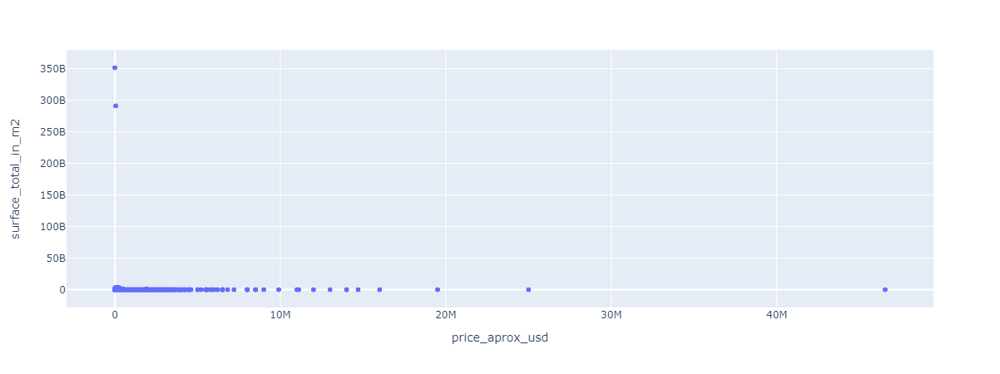

In [260]:
df=df2
px.scatter(df2, y="surface_total_in_m2",x="price_aprox_usd")

In [ ]:
#luego del analisis anterior, detectamos valores fuera de

In [245]:
mean_pm2=df2["price_usd_per_m2"].mean()
print("la media de precio por m2 es",mean_pm2)


la media de precio por m2 es inf


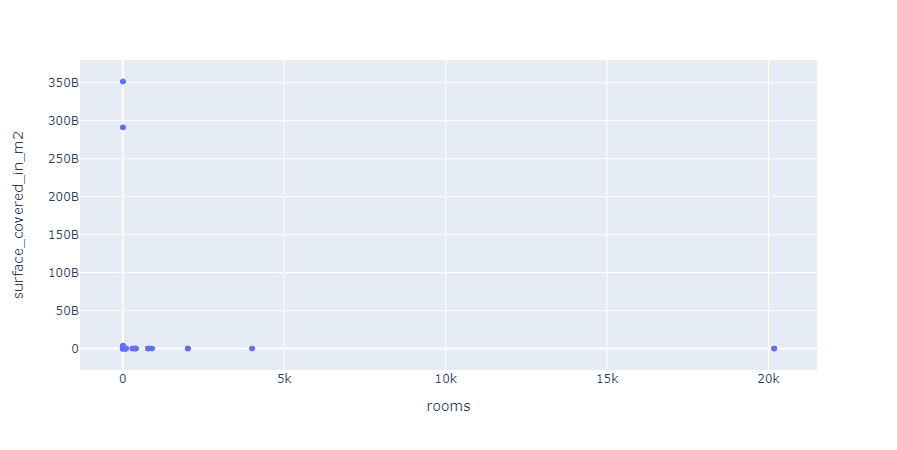

In [252]:
df=data
px.scatter(df, x="rooms",="surface_covered_in_m2")

In [259]:
with sns.axes_style(style='ticks'):
    g = sns.catplot(x = "price_usd_per_m2", y="property_type" hue="rooms", data=df2, kind="box")
    g.set_axis_labels("precio", "Rooms")

SyntaxError: invalid syntax (1569039228.py, line 2)

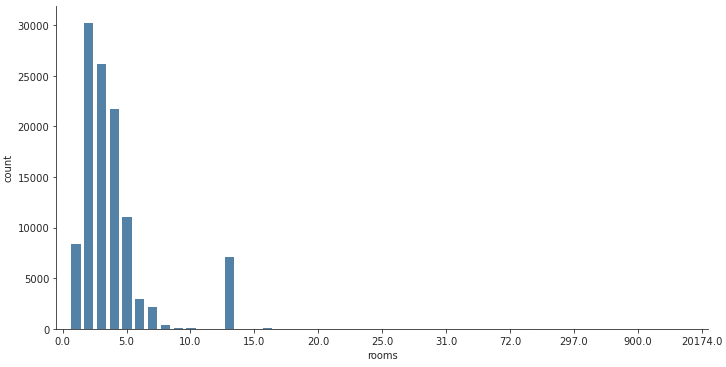

In [255]:
with sns.axes_style('ticks'):
    g = sns.catplot(x = "rooms", data=df, aspect=2, kind="count", color='steelblue')
    g.set_xticklabels(step=5)

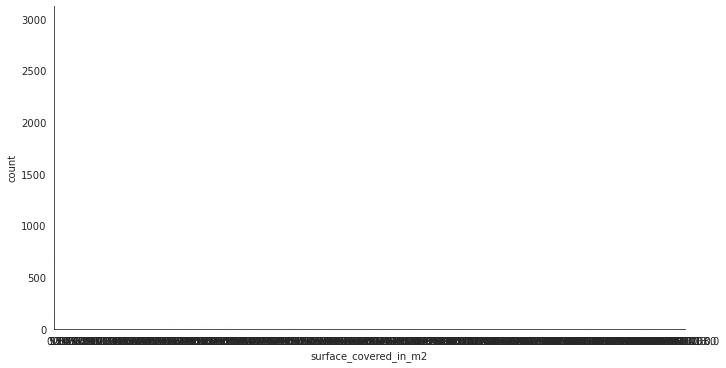

In [254]:
with sns.axes_style('white'):
    g = sns.catplot(x = "surface_covered_in_m2", data=df, aspect=2, kind="count", color='steelblue')
    g.set_xticklabels(step=5)


In [ ]:
by_pm2= df2.sort_values("price_usd_per_m2")
by_pm2.head()